# Assignment 1 - Histogram Equalization

In [1]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt

## Load sample images and visualize

In [2]:
def visualize_samples(folder_path):
    sample_list = os.listdir(folder_path)
    
    for idx, sample_name in enumerate(sample_list):
        sample_path = os.path.join(folder_path, sample_name)
        image = cv2.imread(sample_path)
        
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        axes[0].imshow(image_gray, cmap='gray')
        axes[0].set_title(f'Grayscale {sample_name}')
        axes[0].axis('off')

        axes[1].imshow(image_rgb)
        axes[1].set_title(f'RGB {sample_name}')
        axes[1].axis('off')
        
        plt.show()

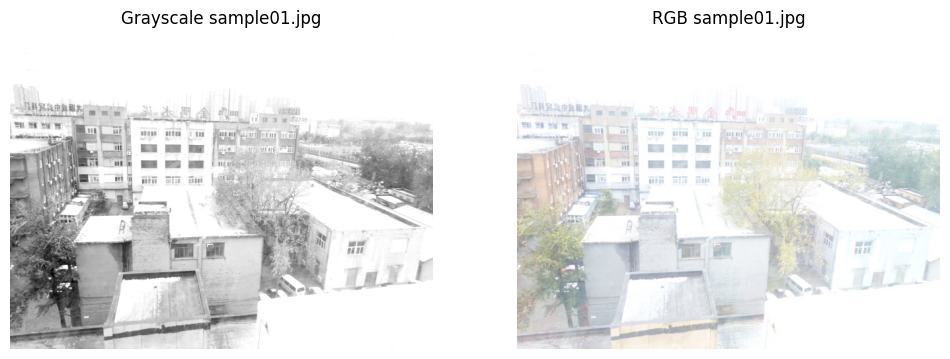

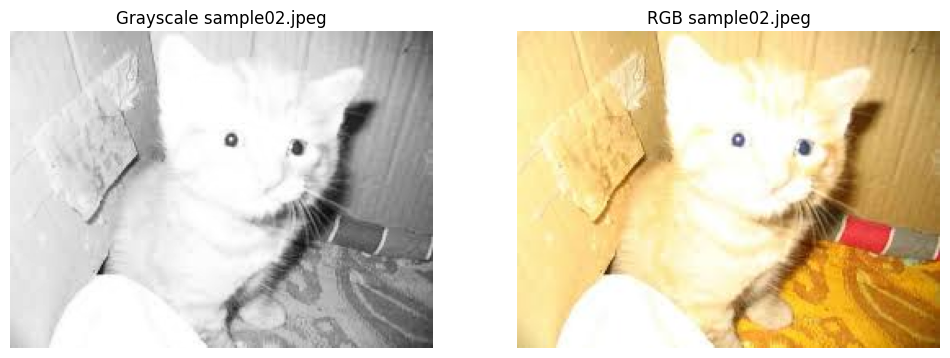

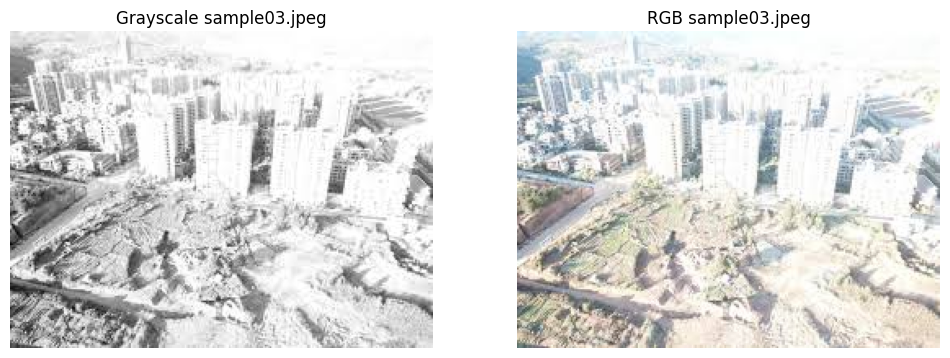

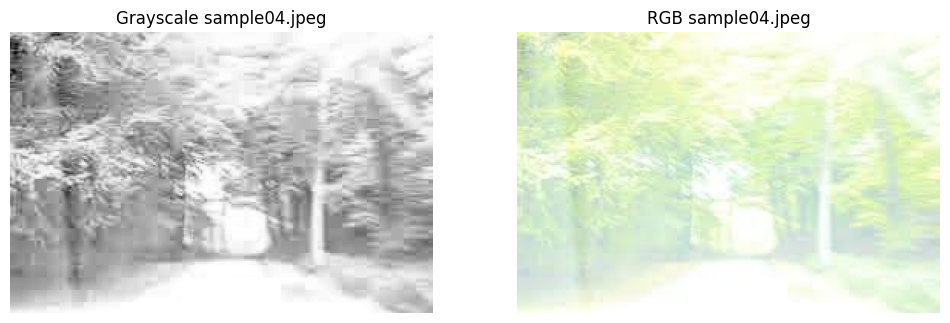

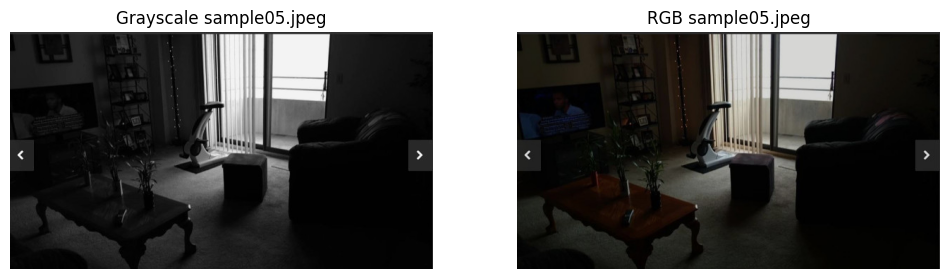

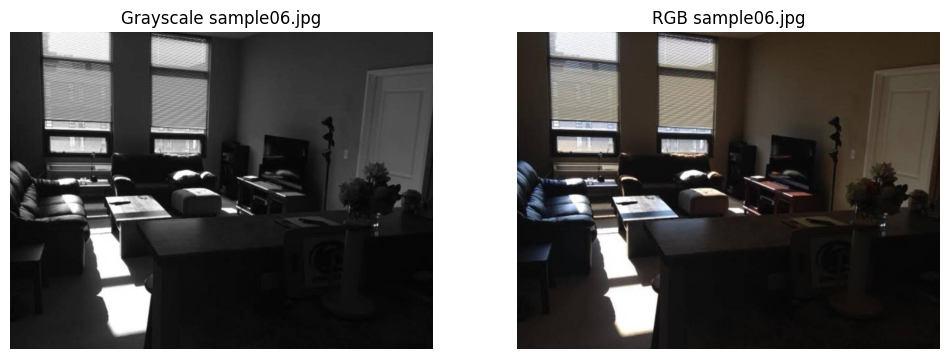

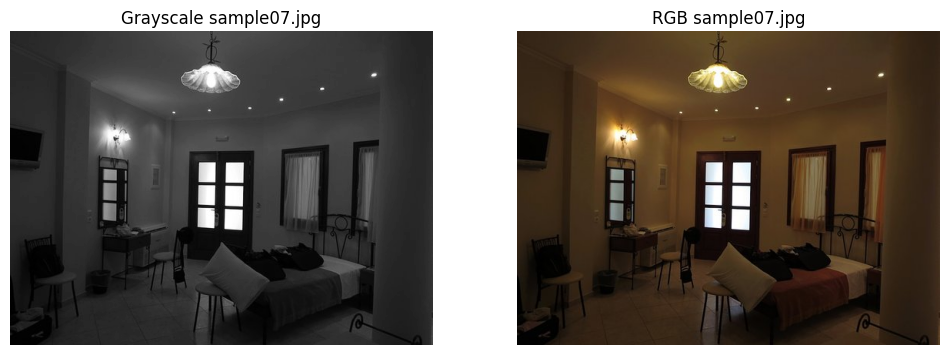

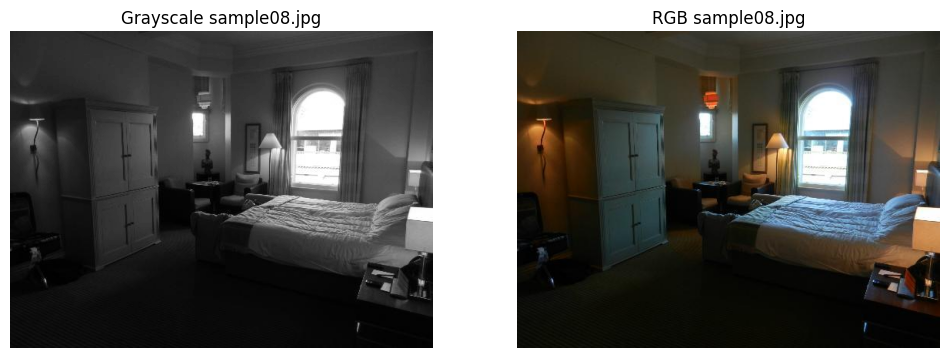

In [3]:
folder_path = 'samples' 
visualize_samples(folder_path)

### Generate histogram of sample images

In [4]:
def load_image(image_path):
    image = cv2.imread(image_path)
    return image

def compute_grayscale_histogram(image):
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    histogram = np.zeros(256, dtype=int)

    for row in image_gray:
        for pixel in row:
            histogram[pixel] += 1

    return histogram

def compute_rgb_histogram(image):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    histogram = {'r': np.zeros(256, dtype=int),
             'g': np.zeros(256, dtype=int),
             'b': np.zeros(256, dtype=int)}

    for row in image_rgb:
        for pixel in row:
            b, g, r = pixel
            histogram['r'][r] += 1
            histogram['g'][g] += 1
            histogram['b'][b] += 1

    return histogram

In [5]:
folder_path = './samples'
image_names = os.listdir(folder_path)
num_images = len(image_names)

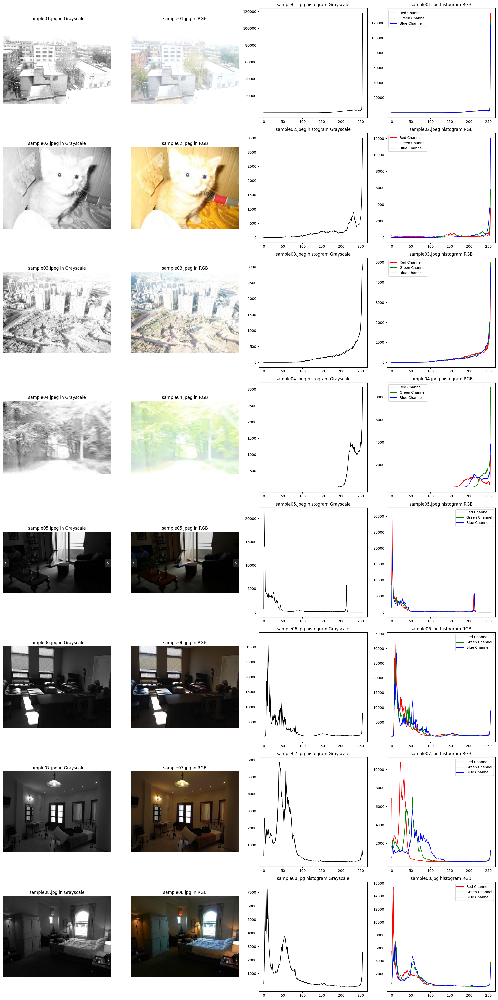

In [6]:
fig, axes = plt.subplots(num_images, 4, figsize=(20, num_images * 5))

for i, image_name in enumerate(image_names):
        image_path = os.path.join(folder_path, image_name)
        image = load_image(image_path)
        
        hist_gray = compute_grayscale_histogram(image)
        hist_rgb = compute_rgb_histogram(image)
        
        axes[i, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY), cmap='gray')
        axes[i, 0].set_title(f'{image_name} in Grayscale')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axes[i, 1].set_title(f'{image_name} in RGB')
        axes[i, 1].axis('off')

        axes[i, 2].plot(hist_gray, color='black')
        axes[i, 2].set_title(f'{image_name} histogram Grayscale')

        axes[i, 3].plot(hist_rgb['r'], color='red', label='Red Channel')
        axes[i, 3].plot(hist_rgb['g'], color='green', label='Green Channel')
        axes[i, 3].plot(hist_rgb['b'], color='blue', label='Blue Channel')
        axes[i, 3].set_title(f'{image_name} histogram RGB')
        axes[i, 3].legend()
        
plt.tight_layout()
plt.show()

## Grayscale Histogram Equalization

In [7]:
def grayscale_HE(image):
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    histogram = compute_grayscale_histogram(image)
    
    # Calculate CDF and Normalize
    cdf = np.cumsum(histogram)
    cdf_normalized = (cdf - cdf.min()) * 255 / (cdf.max() - cdf.min())
    
    rows, cols = image_gray.shape
    equalized_image = np.zeros_like(image)

    # Reassign all pixels using normalized CDF
    for i in range(rows):
        for j in range(cols):
            pixel_value = image_gray[i, j]
            equalized_image[i, j] = cdf_normalized[pixel_value]
            
    equalized_histogram = compute_grayscale_histogram(equalized_image)

    return image_gray, equalized_image, histogram, equalized_histogram

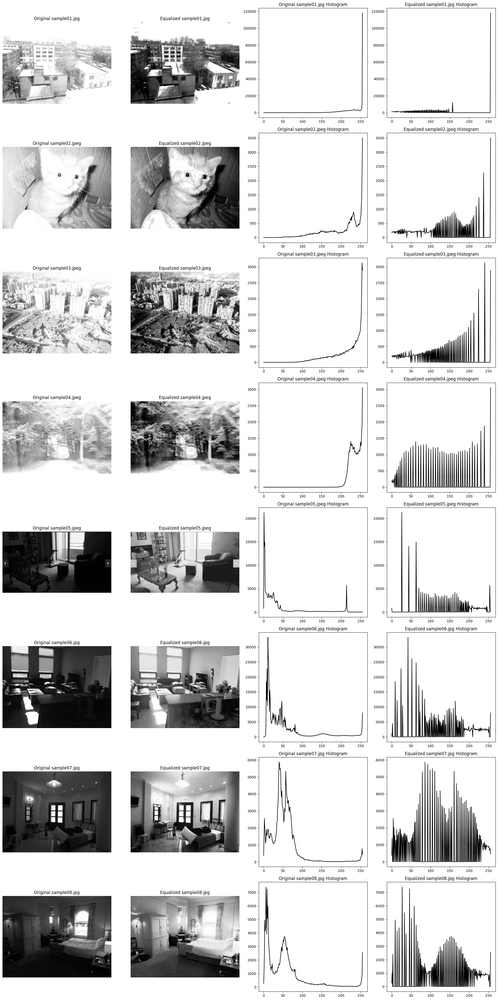

In [8]:
fig, axes = plt.subplots(num_images, 4, figsize=(20, num_images * 5))

for idx, image_name in enumerate(image_names):
    image_path = os.path.join(folder_path, image_name)
    image = load_image(image_path)
    
    image_gray, equalized_image, histogram, equalized_histogram = grayscale_HE(image)

    axes[idx, 0].imshow(image_gray, cmap='gray')
    axes[idx, 0].set_title(f"Original {image_name}")
    axes[idx, 0].axis('off')

    axes[idx, 1].imshow(equalized_image, cmap='gray')
    axes[idx, 1].set_title(f"Equalized {image_name}")
    axes[idx, 1].axis('off')

    axes[idx, 2].plot(histogram, color='black')
    axes[idx, 2].set_title(f"Original {image_name} Histogram")

    axes[idx, 3].plot(equalized_histogram, color='black')
    axes[idx, 3].set_title(f"Equalized {image_name} Histogram")

plt.tight_layout()
plt.show()

## RGB Histogram Equalization

In [9]:
def rgb_HE(image):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    histograms = compute_rgb_histogram(image)
    
    equalized_image = np.zeros_like(image_rgb)
    cdf_normalized = {}
    
    channel_map = {'r': 0, 'g': 1, 'b': 2}

    for color in ['r', 'g', 'b']:
        # Calculate CDF and Normalize for each channel
        histogram = histograms[color]
        cdf = np.cumsum(histogram)
        cdf_normalized[color] = (cdf - cdf.min()) * 255 / (cdf.max() - cdf.min())

        # Apply histogram equalization to each channel
        channel_index = channel_map[color]
        for i in range(image_rgb.shape[0]):
            for j in range(image_rgb.shape[1]):
                pixel_value = image_rgb[i, j, channel_index]
                equalized_image[i, j, channel_index] = cdf_normalized[color][pixel_value]

    equalized_histograms = compute_rgb_histogram(equalized_image)

    return image_rgb, equalized_image, histograms, equalized_histograms

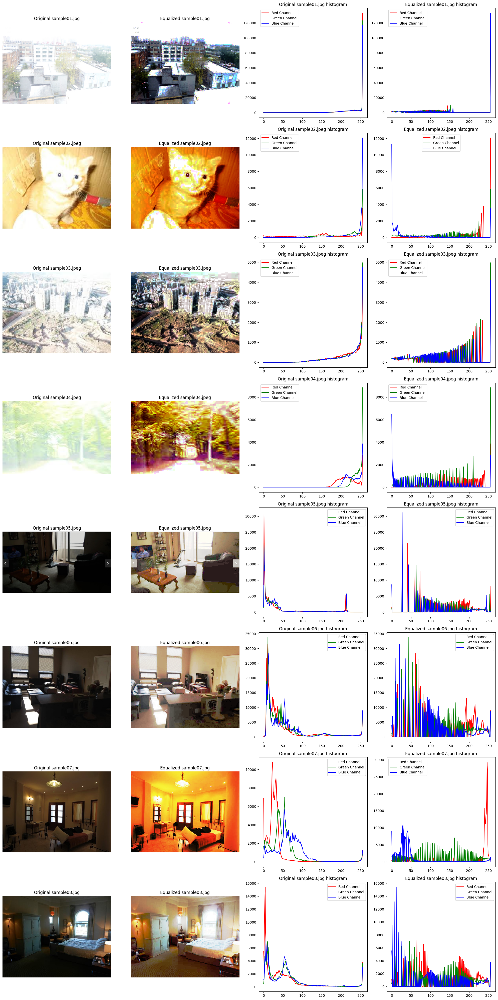

In [10]:
fig, axes = plt.subplots(num_images, 4, figsize=(20, num_images * 5))

for idx, image_name in enumerate(image_names):
    image_path = os.path.join(folder_path, image_name)
    image = load_image(image_path)
    
    image_rgb, equalized_image, histograms, equalized_histograms = rgb_HE(image)

    axes[idx, 0].imshow(image_rgb)
    axes[idx, 0].set_title(f"Original {image_name}")
    axes[idx, 0].axis('off')

    axes[idx, 1].imshow(equalized_image)
    axes[idx, 1].set_title(f"Equalized {image_name}")
    axes[idx, 1].axis('off')

    axes[idx, 2].plot(histograms['r'], color='red', label='Red Channel')
    axes[idx, 2].plot(histograms['g'], color='green', label='Green Channel')
    axes[idx, 2].plot(histograms['b'], color='blue', label='Blue Channel')
    axes[idx, 2].set_title(f'Original {image_name} histogram')
    axes[idx, 2].legend()

    axes[idx, 3].plot(equalized_histograms['r'], color='red', label='Red Channel')
    axes[idx, 3].plot(equalized_histograms['g'], color='green', label='Green Channel')
    axes[idx, 3].plot(equalized_histograms['b'], color='blue', label='Blue Channel')
    axes[idx, 3].set_title(f'Equalized {image_name} histogram')
    axes[idx, 3].legend()

plt.tight_layout()
plt.show()